In [0]:
import urllib
import os
from google_drive_downloader import GoogleDriveDownloader as gdd
import json
import cv2
import numpy as np
from matplotlib import pyplot as plt

In [0]:
mkdir true_images

In [0]:
mkdir cropped_images

In [0]:
gdd.download_file_from_google_drive(file_id='0B2LekbGJrFsIQklqYWZyLXdMOFRucURpQmVhWTdoMThBVEk0',
                                    dest_path='./imageurl.txt')
gdd.download_file_from_google_drive(file_id='0B2LekbGJrFsIVmoxNGRrMmxwdFRnTTJIZGd6VEdXUlZxdktr',
                                    dest_path='./croppedimageurl.txt')

In [0]:
my_path = '/content/true_images/'
cropped_path = '/content/cropped_images/'

In [0]:
f = open("imageurl.txt", "r")
for x in f:
  urllib.request.urlretrieve(x, os.path.join(my_path, os.path.basename(x.strip())))


In [0]:
f = open("croppedimageurl.txt", "r")
for x in f:
  urllib.request.urlretrieve(x, os.path.join(cropped_path, os.path.basename(x.strip())))


In [0]:
true_images = os.listdir(my_path)
cropped_images =  os.listdir(cropped_path)

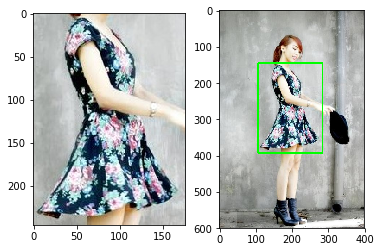

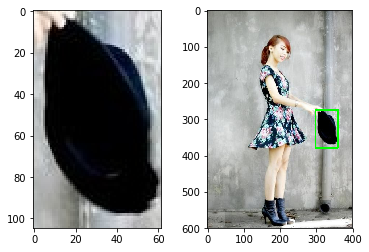

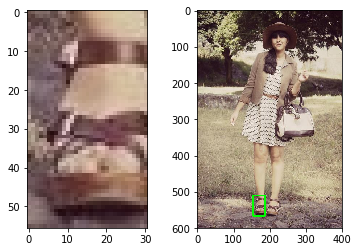

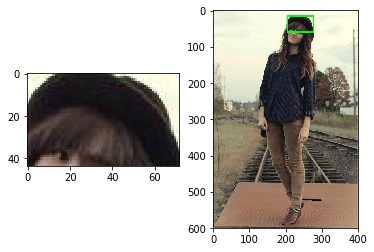

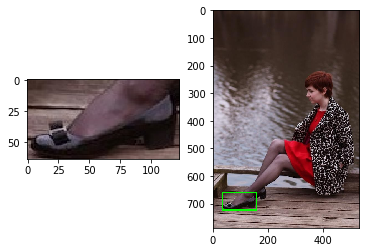

...

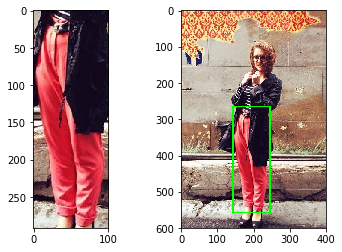

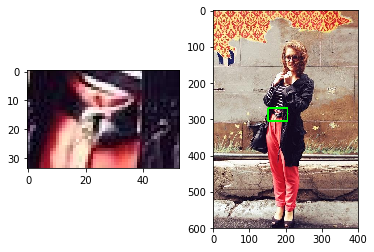

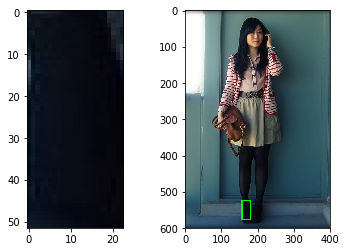

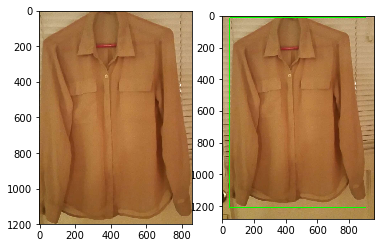

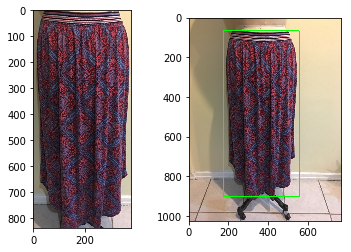

In [0]:
# Loads images from the given url
def load_image(img_id, cropped= False):
  if cropped:
    image = cv2.imread(os.path.join(cropped_path,img_id),1)
  else:
    image = cv2.imread(os.path.join(my_path, img_id),1)
    
  rgb_img = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
  gray_img = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)

  return gray_img, rgb_img


association_map = {}

# Looping over each image in the dataset
for image_id in true_images:
  association_map[image_id] = []
  img_gray, colored_img = load_image(image_id, cropped= False)
  
  for cropped_id in cropped_images:
    # To ensure there's no overlapping in the visualization
    rgb_img = colored_img.copy()
    template, rgb_template = load_image(cropped_id, cropped= True)
    
    # Check and resize of template size is larger than the image
    if template.shape[0] > img_gray.shape[0]:
      template = cv2.resize(template, ( template.shape[1], img_gray.shape[0]))
    elif template.shape[1] > img_gray.shape[1]:
      template = cv2.resize(template, (img_gray.shape[1], template.shape[0]))
      
    w, h = template.shape[::-1]
    # Correlation method used for matching
    method = eval('cv2.TM_CCOEFF_NORMED')

    # Applying template Matching
    res = cv2.matchTemplate(img_gray,template,method)
    
    # Applying a threshold on the res
    threshold = 0.95

    min_val, confidence, min_loc, max_loc = cv2.minMaxLoc(res)
    top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)
    
    # If the confidence is above thresold, associate the crop and image
    if confidence > threshold:
      position = list(top_left)
      position.extend(list(bottom_right))

      association_map[image_id].append(tuple([cropped_id, position]))
      cv2.rectangle(rgb_img, top_left, bottom_right, (0,255,0), 4)
      
      plt.subplot(122),plt.imshow(rgb_img)
      plt.subplot(121),plt.imshow(rgb_template)
      plt.show()

# Finding crops without any image association
available_crops = np.asarray([values for values in association_map.values()]).flatten()
unavailable_crops = [x for x in [item for item in cropped_images if item not in available_crops]]
association_map['na'] = [(x, []) for x in unavailable_crops]
  
# Storing the result in a json file.
with open('result.json', 'w') as fp:
    json.dump(association_map, fp)